In [38]:
import lal
import _pickle as pickle
from tqdm import tqdm
from main import *
from utils import *
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from tqdm import tqdm
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from itertools import cycle


In [39]:
test_dataset = np.load('test.npy')
test_dataset.shape

(1200, 1, 2, 16384)

In [40]:
data_loader = DataLoader(test_dataset, batch_size=32, shuffle=False,)

In [41]:
# load model
device = torch.device('cuda')

# Where we output our model and loss history
checkpoint_dir = './checkpoints_cnn/'

# Creat model
net, epoch, train_loss_history = load_model(checkpoint_dir)
net.to(device);

Load network from checkpoints_cnn/model_e99.pt


In [42]:
results = evaluate_submissoin_gpu(net, data_loader, device)
len(results)

1200

100%|██████████| 12/12 [00:00<00:00, 79.97it/s]


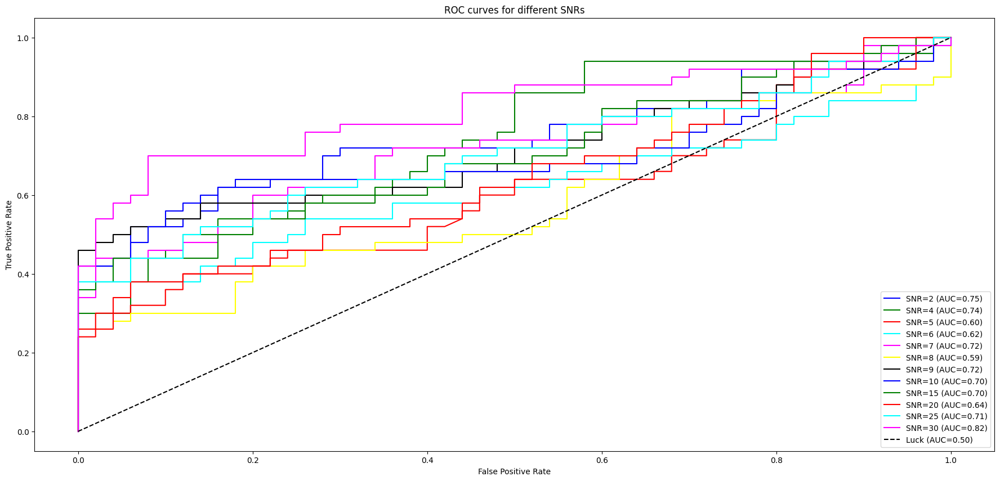

In [51]:
# 定义预测函数
def evaluate_submission_gpu(net, data_loader, device=None):
    if isinstance(net, nn.Module):
        net.eval()  # 设置为评估模式
        if not device:
            device = next(iter(net.parameters())).device  # 获取设备信息
    softmax = nn.Softmax(dim=-1)  # 定义softmax函数
    y_hat_list = []  # 初始化预测结果列表
    with torch.no_grad():  # 不进行梯度计算
        for X in data_loader:  # 遍历数据集
            X = X.to(device).to(torch.float)  # 将数据转移到设备上并转换为浮点型
            y_hat = net(X)  # 使用模型进行预测
            preds = softmax(y_hat).cpu().numpy()[:, 1].tolist()  # 使用softmax处理预测结果
            y_hat_list.extend(preds)  # 将预测结果添加到列表
    return np.array(y_hat_list)  # 返回NumPy数组

# 进行预测
y_hat_list = evaluate_submission_gpu(net, data_loader, device)

# 创建真实标签
# 前600个样本标记为0（不包含信号），后600个样本标记为1（包含信号）
ground_truth = np.concatenate([np.zeros(600), np.ones(600)])

# 创建SNR标签数组
snr_values = np.array([2, 4, 5, 6, 7, 8, 9, 10, 15, 20, 25, 30])
snr_labels = np.tile(snr_values, 100)  # 每个SNR重复100次

# 定义颜色列表
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black'])

# 定义 SNR 列表
snr_list = [2, 4, 5, 6, 7, 8, 9, 10, 15, 20, 25, 30]
plt.figure(figsize=(22, 10))  # 设置图像大小为12x8英寸
# 绘制 ROC 曲线
for snr in tqdm(snr_list):
    # 根据SNR分组
    snr_indices = np.where(snr_labels == snr)[0]
    y_hat_snr = y_hat_list[snr_indices]
    gt_snr = ground_truth[snr_indices]
    
    # 检查是否有正负样本
    if np.any(gt_snr == 1) and np.any(gt_snr == 0):
        fpr, tpr, thresholds = roc_curve(gt_snr, y_hat_snr)
        auc_value = roc_auc_score(gt_snr, y_hat_snr)
        plt.plot(fpr, tpr, color=next(colors), label=f'SNR={snr} (AUC={auc_value:.2f})')
    else:
        print(f"No positive or negative samples for SNR={snr}, skipping ROC curve.")

# 绘制对角线
plt.plot(np.linspace(0, 1, 100), np.linspace(0, 1, 100), 'k--', label='Luck (AUC=0.50)')

# 设置图形属性
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curves for different SNRs")
plt.legend()
plt.show()

100%|██████████| 12/12 [00:00<00:00, 285.77it/s]


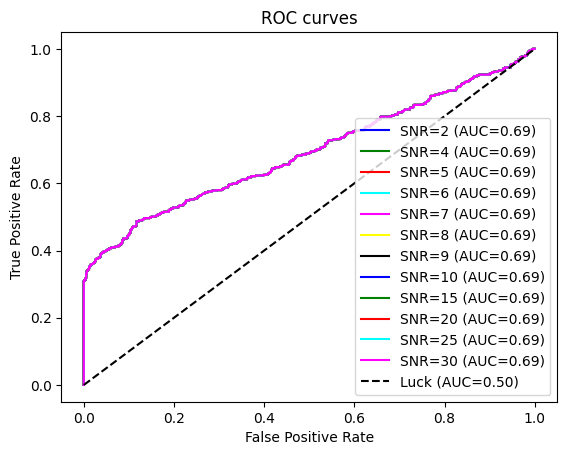

In [20]:
# 定义预测函数
def evaluate_submissoin_gpu(net, data_loader, device=None):
    if isinstance(net, nn.Module):
        net.eval()  # 设置为评估模式
        if not device:
            device = next(iter(net.parameters())).device  # 获取设备信息
    softmax = nn.Softmax(dim=-1)  # 定义softmax函数
    y_hat_list = []  # 初始化预测结果列表
    with torch.no_grad():  # 不进行梯度计算
        for X in data_loader:  # 遍历数据集
            X = X.to(device).to(torch.float)  # 将数据转移到设备上并转换为浮点型
            y_hat = net(X)  # 使用模型进行预测
            preds = softmax(y_hat).cpu().numpy()[:, 1].tolist()  # 使用softmax处理预测结果
            y_hat_list.extend(preds)  # 将预测结果添加到列表
    return y_hat_list

# 进行预测
y_hat_list = evaluate_submissoin_gpu(net, data_loader, device)

# 创建真实标签
# 前600个样本标记为0（不含信号），后600个样本标记为1（包含信号）
groud_truth = np.concatenate([np.zeros(600), np.ones(600)])

# 定义颜色列表
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black'])

# 定义 SNR 列表
snr_list = [2, 4, 5, 6, 7, 8, 9, 10, 15, 20, 25, 30]

# 绘制 ROC 曲线
for snr in tqdm(snr_list):
    fpr, tpr, thresholds = roc_curve(groud_truth, y_hat_list)
    auc_value = roc_auc_score(groud_truth, y_hat_list)
    plt.plot(fpr, tpr, color=next(colors), label=f'SNR={snr} (AUC={auc_value:.2f})')

# 绘制对角线
plt.plot(np.linspace(0, 1, 100), np.linspace(0, 1, 100), 'k--', label='Luck (AUC=0.50)')

# 设置图形属性
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curves")
plt.legend()
plt.show()




In [25]:
import numpy as np

# 指定.npy文件的路径
file_path = '/home/zhangyongxin/深度学习网络/test.npy'

# 使用NumPy加载.npy文件
data = np.load(file_path)

# 打印文件内容的基本信息
print("Data shape:", data.shape)
print("Data type:", data.dtype)
print("Data content:")
print(data[:5])  # 打印前5个元素，如果数据量很大，可以减少这个数字

Data shape: (1200, 1, 2, 16384)
Data type: float64
Data content:
[[[[-5.21553068e-02 -4.05558215e-02 -2.12266090e-02 ... -6.65445548e-02
    -6.58085282e-02 -6.41174402e-02]
   [-2.96661882e-01 -2.31470733e-01 -1.46438968e-01 ... -3.31304919e-01
    -3.50141852e-01 -3.39756532e-01]]]


 [[[-2.16960404e-01 -1.15343217e-01 -3.64209867e-03 ... -2.83664311e-01
    -3.06600651e-01 -2.76199647e-01]
   [ 2.39139990e-02  5.77718177e-02  9.27772096e-02 ... -9.73942675e-02
    -5.82271095e-02 -2.23768781e-02]]]


 [[[-2.30511976e-02  3.90523523e-02  1.04801600e-01 ... -1.86715253e-01
    -1.42210848e-01 -9.18244271e-02]
   [-1.55673731e-01 -1.19816150e-01 -7.66339967e-02 ... -2.36336216e-01
    -2.18010877e-01 -1.94732477e-01]]]


 [[[-2.33844217e-04 -6.44178440e-02 -9.90832044e-02 ...  1.91629516e-01
     1.36173668e-01  6.06360896e-02]
   [-8.52247021e-02 -1.88580703e-01 -2.73923831e-01 ...  2.21921214e-01
     1.32687089e-01  2.78541083e-02]]]


 [[[-3.95496512e-02  3.38008477e-02  1.04132346

In [32]:
import numpy as np

# 指定.npy文件的路径
file_path = '/home/zhangyongxin/深度学习网络/test.npy'

# 使用NumPy加载.npy文件
data = np.load(file_path)

# 初始化存储结果的列表
sub_element_means_list = []
element_means_list = []

# 遍历每个元素，计算每个子元素的平均值和元素的整体平均值
for i in range(data.shape[0]):
    # 提取第i个元素
    element = data[i]
    
    # 对每个数据取绝对值
    absolute_element = np.abs(element)
    
    # 计算每个子元素的平均值
    sub_element_means = np.mean(absolute_element, axis=2)
    
    # 计算元素的整体平均值，即两个子元素平均值的平均
    element_mean = np.mean(sub_element_means)
    
    # 将子元素平均值和元素平均值添加到列表中
    sub_element_means_list.append(sub_element_means)
    element_means_list.append(element_mean)

# 将结果转换为NumPy数组
sub_element_means_array = np.array(sub_element_means_list)
element_means_array = np.array(element_means_list)

# 打印结果
for i in range(data.shape[0]):
    print(f"第{i+1}个元素的平均值: {element_means_array[i]}")
    for j in range(sub_element_means_array.shape[1]):
        print(f"  其中含有的第{j+1}个子元素的平均值: {sub_element_means_array[i, j]}")

第1个元素的平均值: 0.7554681980249713
  其中含有的第1个子元素的平均值: [0.75985304 0.75108336]
第2个元素的平均值: 0.7536806109377097
  其中含有的第1个子元素的平均值: [0.75077342 0.7565878 ]
第3个元素的平均值: 0.7507567261945768
  其中含有的第1个子元素的平均值: [0.75274361 0.74876984]
第4个元素的平均值: 0.7539836805110737
  其中含有的第1个子元素的平均值: [0.75376307 0.75420429]
第5个元素的平均值: 0.754318331313877
  其中含有的第1个子元素的平均值: [0.75435506 0.75428161]
第6个元素的平均值: 0.7546171138799477
  其中含有的第1个子元素的平均值: [0.7585526  0.75068162]
第7个元素的平均值: 0.7432678760004645
  其中含有的第1个子元素的平均值: [0.74570434 0.74083141]
第8个元素的平均值: 0.7488965814751867
  其中含有的第1个子元素的平均值: [0.7474861  0.75030706]
第9个元素的平均值: 0.7501837781645231
  其中含有的第1个子元素的平均值: [0.74376896 0.75659859]
第10个元素的平均值: 0.7501134532772209
  其中含有的第1个子元素的平均值: [0.74653742 0.75368949]
第11个元素的平均值: 0.7558793723363618
  其中含有的第1个子元素的平均值: [0.75861667 0.75314208]
第12个元素的平均值: 0.7506184798129976
  其中含有的第1个子元素的平均值: [0.74598223 0.75525473]
第13个元素的平均值: 0.7504873296561246
  其中含有的第1个子元素的平均值: [0.74877505 0.75219961]
第14个元素的平均值: 0.7473566651482422
  其中含有的第1个子元素的平均值

In [33]:
import numpy as np

# 指定.npy文件的路径
file_path = '/home/zhangyongxin/深度学习网络/test.npy'

# 使用NumPy加载.npy文件
data = np.load(file_path)

# 提取第一个元素
first_element = data[0]

# 对第一个元素中的每个数据取绝对值
absolute_first_element = np.abs(first_element)

# 计算每个子元素的平均值
sub_element_means = np.mean(absolute_first_element, axis=2)

# 计算第一个元素的整体平均值
element_mean = np.mean(sub_element_means)

# 打印结果
print("第一个元素的绝对值内容:")
print(absolute_first_element)
print("\n第一个元素中每个子元素的平均值:")
print(sub_element_means)
print(f"\n第一个元素的整体平均值: {element_mean}")

第一个元素的绝对值内容:
[[[0.05215531 0.04055582 0.02122661 ... 0.06654455 0.06580853 0.06411744]
  [0.29666188 0.23147073 0.14643897 ... 0.33130492 0.35014185 0.33975653]]]

第一个元素中每个子元素的平均值:
[[0.75985304 0.75108336]]

第一个元素的整体平均值: 0.7554681980249713


In [35]:
import numpy as np

# 指定.npy文件的路径
file_path = '/home/zhangyongxin/深度学习网络/test.npy'

# 使用NumPy加载.npy文件
data = np.load(file_path)

# 设置NumPy打印选项以显示完整的数组
np.set_printoptions(threshold=np.inf, suppress=False)

# 提取第一个元素
first_element = data[0]

# 打印第一个元素的内容
print("第一个元素的内容:")
print(first_element)

第一个元素的内容:
[[[-5.21553068e-02 -4.05558215e-02 -2.12266090e-02 -5.74588144e-03
    1.34531457e-02  2.48115539e-02  3.65744159e-02  3.85274575e-02
    3.94855157e-02  2.96465433e-02  2.03869523e-02  1.36124474e-03
   -1.47622148e-02 -3.50694948e-02 -4.63520628e-02 -5.92667834e-02
   -6.15999718e-02 -6.50726224e-02 -5.57945158e-02 -4.70865820e-02
   -2.91084214e-02 -1.47360807e-02  6.38892566e-03  1.95104327e-02
    3.29551774e-02  4.41820289e-02  4.46880444e-02  3.96339303e-02
    3.63579863e-02  1.76562222e-02  1.02715184e-03 -1.79467694e-02
   -3.29589136e-02 -4.62028324e-02 -5.77969744e-02 -5.81109847e-02
   -5.32751151e-02 -5.17871386e-02 -3.43778172e-02 -2.54455955e-02
   -7.37716477e-03  1.31794492e-02  3.13834883e-02  4.15671387e-02
    5.05730070e-02  4.08633395e-02  4.34340868e-02  5.47708871e-02
    2.04826735e-02  2.10008375e-03 -1.89621509e-02 -3.75402418e-02
   -3.54451615e-02 -6.29582496e-02 -4.50133052e-02 -4.15183588e-02
   -2.80945762e-02 -3.34130021e-02 -3.17537685e-03  

/tmp/ipykernel_53850/3118843127.py:28: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


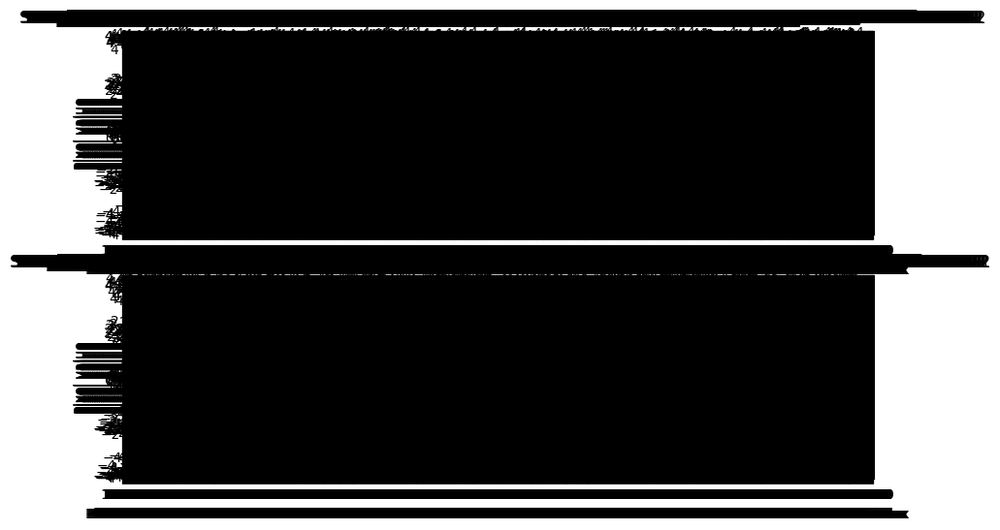

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# 指定.npy文件的路径
file_path = '/home/zhangyongxin/深度学习网络/test.npy'

# 使用NumPy加载.npy文件
data = np.load(file_path)

# 设置绘图参数
plt.figure(figsize=(10, 6))

# 遍历每个样本
for i in range(data.shape[0]):
    # 提取第i个样本的两个子元素
    sample = data[i, 0, :, :]
    
    # 绘制每个子元素
    for j in range(sample.shape[0]):
        plt.subplot(2, data.shape[0], i * 2 + j + 1)  # 2行，每个样本2列
        plt.plot(sample[j])
        plt.title(f'Sample {i+1}, Sub-element {j+1}')
        plt.xlabel('Pixel index')
        plt.ylabel('Pixel value')
        plt.grid(True)

# 调整子图间距
plt.tight_layout()

# 显示图像
plt.show()

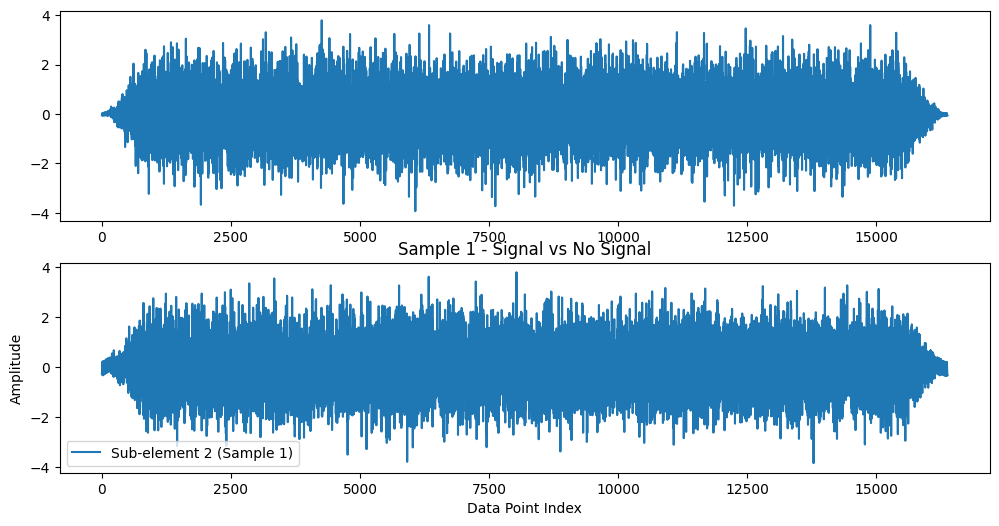

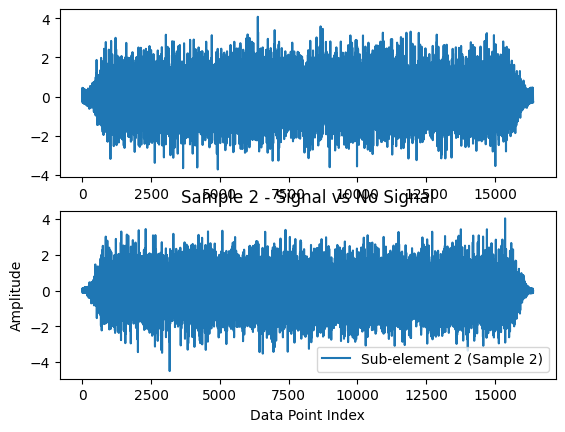

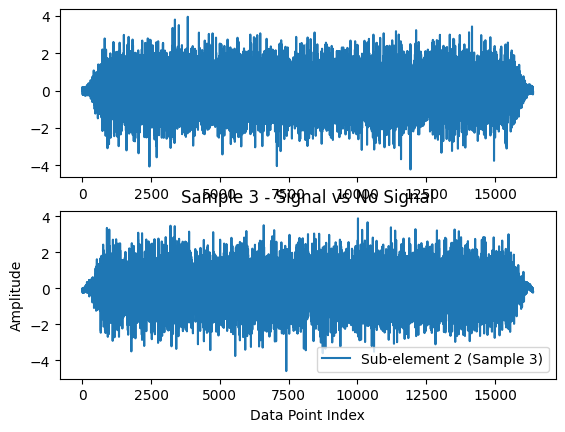

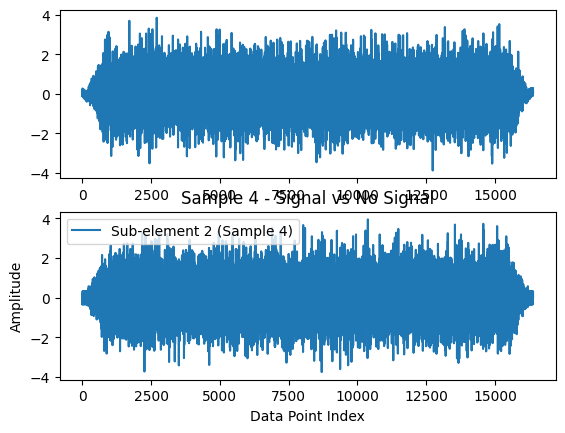

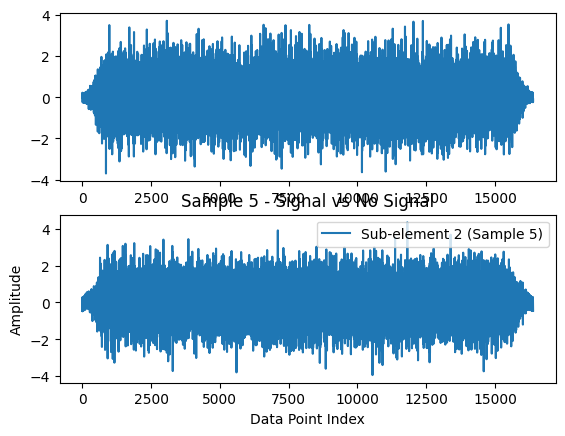

...

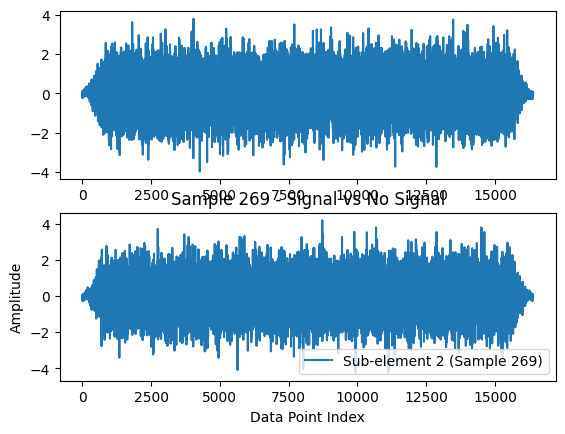

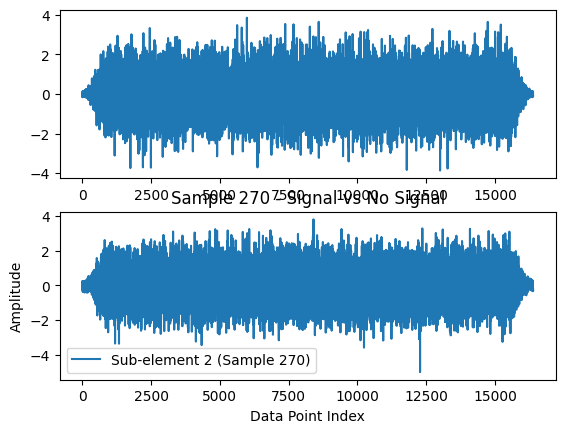

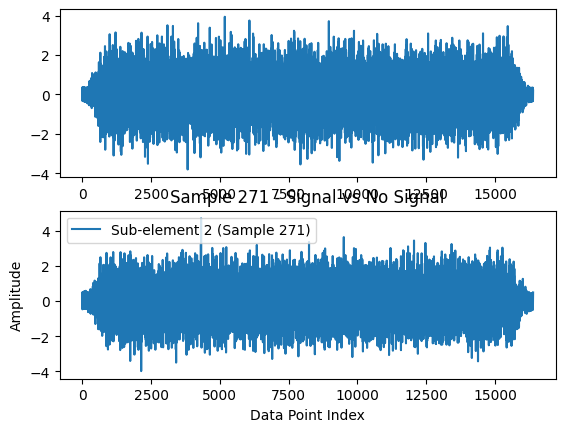

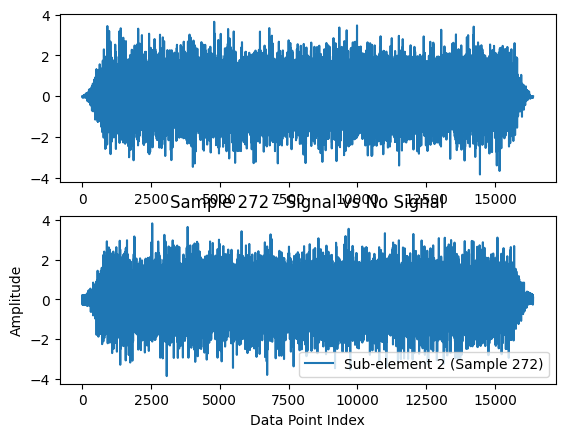

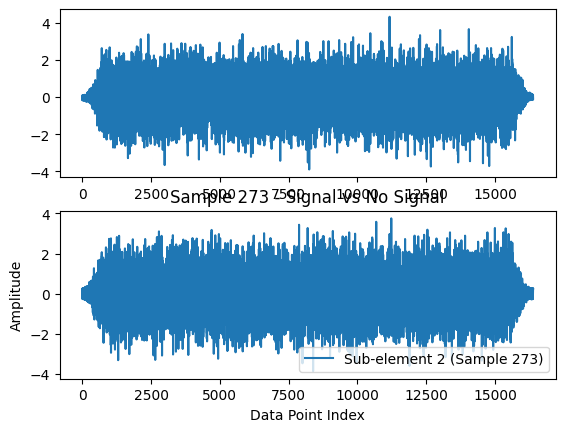

Exception ignored in: <function TransformNode.set_children.<locals>.<lambda> at 0x7f1fd5bbf9d0>
Traceback (most recent call last):
  File "/home/opt/python/anaconda3.8_TF2.5/envs/torch_1.12.1/lib/python3.8/site-packages/matplotlib/transforms.py", line 209, in <lambda>
    self, lambda _, pop=child._parents.pop, k=id(self): pop(k))
KeyboardInterrupt: 


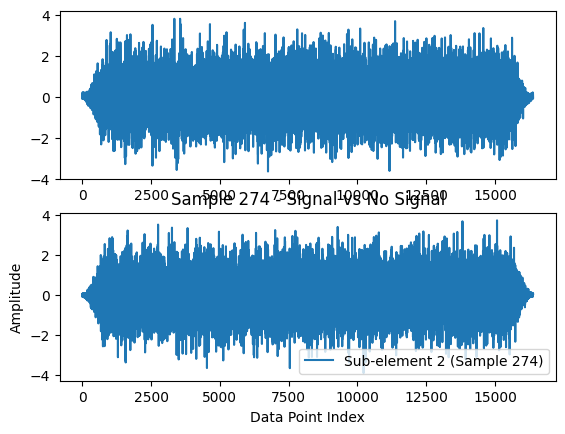

KeyboardInterrupt: 

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# 指定.npy文件的路径
file_path = '/home/zhangyongxin/深度学习网络/test.npy'

# 使用NumPy加载.npy文件
data = np.load(file_path)

# 设置绘图参数
plt.figure(figsize=(12, 6))

# 遍历每个样本
for i in range(data.shape[0]):
    # 提取第i个样本的两个子元素
    sample = data[i, 0, :, :]
    
    # 绘制每个子元素
    plt.subplot(2, 1, 1)  # 2行1列，第1个位置
    plt.plot(sample[0], label=f'Sub-element 1 (Sample {i+1})')
    plt.subplot(2, 1, 2)  # 2行1列，第2个位置
    plt.plot(sample[1], label=f'Sub-element 2 (Sample {i+1})')
    
    # 添加图例和标题
    plt.legend()
    plt.title(f'Sample {i+1} - Signal vs No Signal')
    plt.xlabel('Data Point Index')
    plt.ylabel('Amplitude')
    
    # 显示图像
    plt.show()